In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from importlib import reload
from tqdm import tqdm

In [2]:
NOTEBOOK_DIR = os.getcwd()
MODULE_DIR, _ = os.path.split(NOTEBOOK_DIR)
sys.path.append(MODULE_DIR)

In [3]:
from longterm import load, utils

In [4]:
fly_dir = os.path.join(load.NAS2_DIR_LH, "210512", "fly3")
trial_dirs = utils.readlines_tolist(os.path.join(fly_dir, "trial_dirs.txt"))
trial_dir = trial_dirs[2]  # [2,4,5,11]
processed_dir = os.path.join(trial_dir, load.PROCESSED_FOLDER)
neural_df_dir = os.path.join(processed_dir, "twop_df.pkl")
neural_df = pd.read_pickle(neural_df_dir)
opflow_df_dir = os.path.join(processed_dir, "opflow_df.pkl")
opflow_df = pd.read_pickle(opflow_df_dir)
beh_df_dir = os.path.join(processed_dir, "beh_df.pkl")
beh_df = pd.read_pickle(beh_df_dir)

In [5]:
neural_df

t     neuron_0  \
Date   Genotype Fly TrialName Trial Frame                            
210512 J1xM5    3   cs_002    2     0        1.847967  1157.573067   
                                    1        1.909533  1164.480984   
                                    2        1.971133  1054.520719   
                                    3        2.032733  1244.454934   
                                    4        2.094333  1351.683888   
...                                               ...          ...   
                                    3835   238.074733   730.121807   
                                    3836   238.136333   737.949252   
                                    3837   238.197933   876.988216   
                                    3838   238.259533   990.925200   
                                    3839   238.321133   757.086398   

                                              neuron_1     neuron_2  \
Date   Genotype Fly TrialName Trial Frame                             
210512 J1xM5    3   cs_002    2     0        90.703030   349.615330   
                                    1        93.294244   358.924832   
                                    2       129.031318   424.788219   
                                    3        72.785045   348.945714   
                                    4        99.029462   449.839171   
...                                                ...          ...   
                                    3835   1310.460584   926.790071   
                                    3836   1040.564083  1016.324322   
                                    3837   1229.986110   927.690387   
                                    3838   1249.900272   912.380396   
                                    3839   1319.140121  1027.207434   

                                             neuron_3    neuron_4  \
Date   Genotype Fly TrialName Trial Frame                           
210512 J1xM5    3   cs_002    2     0      549.109802  547.994125   
                                    1      591.942264  783.069327   
                                    2      669.296872  810.834104   
                                    3      551.875228  719.474557   
                                    4      566.215383  596.589864   
...                                               ...         ...   
                                    3835   250.756585  395.585154   
                                    3836   212.526905  300.916937   
                                    3837   232.270226  360.705186   
                                    3838   267.928091  419.099312   
                                    3839   263.320859  296.578323   

                                              neuron_5     neuron_6  \
Date   Genotype Fly TrialName Trial Frame                             
210512 J1xM5    3   cs_002    2     0       464.272475   466.293379   
                                    1       627.582823   657.139880   
                                    2       672.560944   645.293537   
                                    3       667.563964   636.383595   
                                    4       541.582409   575.127390   
...                                                ...          ...   
                                    3835   1250.155029  1039.175003   
                                    3836   1381.207452  1022.883584   
                                    3837   1570.055224  1074.430167   
                                    3838   1381.551257   819.956474   
                                    3839   1521.021091   969.899982   

                                             neuron_7     neuron_8  ...  \
Date   Genotype Fly TrialName Trial Frame                           ...   
210512 J1xM5    3   cs_002    2     0      159.455821   166.869301  ...   
                                    1      230.658788   169.282825  ...   
                                    2      289.572976   196.978526  ...   
                    

<IPython.core.display.Javascript object>


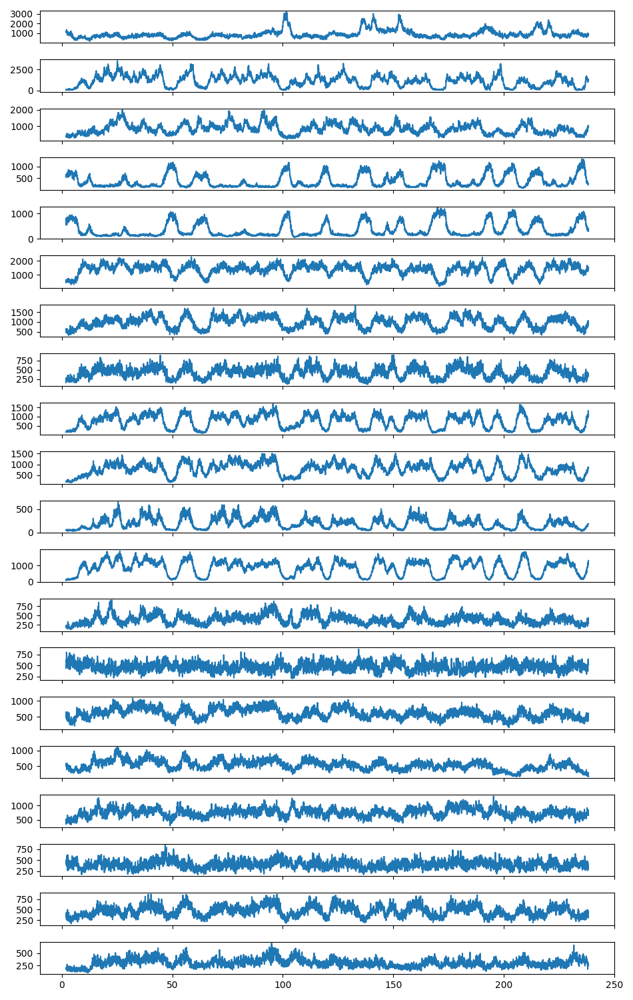

In [6]:
%matplotlib notebook

t = np.arange(3840) / 16

N_rows = 20
N_offset = 0  # 103  # 100  # 80  # 60  # 40  # 20

fig, axs = plt.subplots(nrows=N_rows, ncols=1, figsize=(9.5, 15), sharex=True, sharey="row")
for i_row, ax in enumerate(axs):
    i_roi = N_offset + i_row
    ax.plot(neural_df.t, neural_df.filter(regex="neuron").iloc[:, i_roi])

plt.tight_layout()

In [7]:
opflow_df

t           twop_index  \
Date   Genotype Fly TrialName Trial Frame                                    
210512 J1xM5    3   cs_002    2     0        0.001433 -9223372036854775808   
                                    1        0.003900 -9223372036854775808   
                                    2        0.006400 -9223372036854775808   
                                    3        0.008900 -9223372036854775808   
                                    4        0.011367 -9223372036854775808   
...                                               ...                  ...   
                                    94621  240.293300 -9223372036854775808   
                                    94622  240.296267 -9223372036854775808   
                                    94623  240.298767 -9223372036854775808   
                                    94624  240.301700 -9223372036854775808   
                                    94625  240.304200 -9223372036854775808   

                                           sens0X  sens0Y  sens1X  sens1Y  \
Date   Genotype Fly TrialName Trial Frame                                   
210512 J1xM5    3   cs_002    2     0      -84.48  -12.92  -87.04  -37.95   
                                    1      -52.14    0.00  -63.24    0.00   
                                    2        0.00    0.00    0.00    0.00   
                                    3        0.00    0.00    0.00    0.00   
                                    4        0.00    0.00    0.00    0.00   
...                                           ...     ...     ...     ...   
                                    94621    0.00    0.00    0.00    0.00   
                                    94622    0.00    0.00    0.00    0.00   
                                    94623    0.00    0.00    0.00    0.00   
                                    94624   -0.66    0.00   -0.68    0.00   
                                    94625    0.00    0.00    0.00    0.00   

                                           OpflowTime   velForw   velSide  \
Date   Genotype Fly TrialName Trial Frame                                   
210512 J1xM5    3   cs_002    2     0      1610714726  0.449632  0.221236   
                                    1      1610714729  0.449632  0.221236   
                                    2      1610714732  0.449632  0.221236   
                                    3      1610714734  0.449632  0.221236   
                                    4      1610714737  0.449632  0.221236   
...                                               ...       ...       ...   
                                    94621  1610955078 -0.018031  0.018031   
                                    94622  1610955080 -0.018031  0.018031   
                                    94623  1610955082 -0.018031  0.018031   
                                    94624  1610955085 -0.018031  0.018031   
                                    94625  1610955088 -0.018031  0.018031   

                                            velTurn   walk   rest  
Date   Genotype Fly TrialName Trial Frame                          
210512 J1xM5    3   cs_002    2     0     -1.793125  False  False  
                                    1     -1.793125  False  False  
                                    2     -1.793125  False  False  
                                    3     -1.793125  False  False  
                                    4     -1.793125  False  False  
...                                             ...    ...    ...  
                                    94621 -0.033500  False  False  
                                    94622 -0.033500  False  False  
                                    94623 -0.033500  False  False  
                                    94624 -0.033500  False  False  
                                    94625 -0.033500  False  False  

[94626 rows x 12 columns]

In [8]:
beh_df

t           twop_index
Date   Genotype Fly TrialName Trial Frame                                 
210512 J1xM5    3   cs_002    2     0        0.011100 -9223372036854775808
                                    1        0.023600 -9223372036854775808
                                    2        0.036100 -9223372036854775808
                                    3        0.048600 -9223372036854775808
                                    4        0.061100 -9223372036854775808
...                                               ...                  ...
                                    19194  239.877300 -9223372036854775808
                                    19195  239.889767 -9223372036854775808
                                    19196  239.902267 -9223372036854775808
                                    19197  239.914767 -9223372036854775808
                                    19198  239.927267 -9223372036854775808

[19199 rows x 2 columns]

In [9]:
from scipy.ndimage import gaussian_filter1d
from scipy.ndimage.filters import convolve


In [17]:
import longterm.plot as myplt

<IPython.core.display.Javascript object>


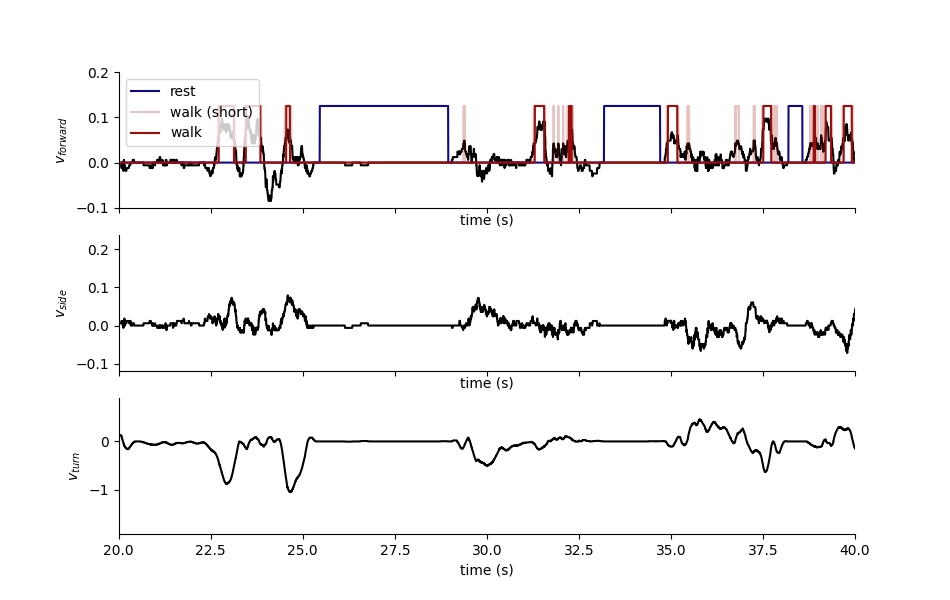

In [31]:
%matplotlib notebook

def apply_filter(x, sigma=80):
    # return gaussian_filter1d(x, sigma=sigma, axis=0)
    return np.convolve(x, np.ones((sigma))/sigma, mode="same")

alpha = 0.5
offset = 10

v_f = opflow_df.velForw[offset:]  # apply_filter(opflow_df.velForw[offset:])
v_s = opflow_df.velSide[offset:]  # apply_filter(opflow_df.velSide[offset:])
v_t = opflow_df.velTurn[offset:]  # apply_filter(opflow_df.velTurn[offset:])
rest = np.logical_and.reduce((np.abs(v_f) <= 0.01, np.abs(v_s) <= 0.01, np.abs(v_t) <= 0.01))
rest_strict = np.logical_and(np.convolve(rest, np.ones(200)/200, mode="same") > 0.75, rest)
walk = v_f >= 0.04
walk_strict = np.logical_and(np.convolve(walk, np.ones(50)/50, mode="same") > 0.75, walk)



fig, axs = plt.subplots(3,1,figsize=(9.5,6), sharex=True)  # , sharey=True)
# axs[0].plot(opflow_df.t[10:], opflow_df.velForw[10:],'k', alpha=alpha)
axs[0].plot(opflow_df.t[offset:], v_f,color=myplt.BLACK)
# axs[0].plot(opflow_df.t[offset:], rest*0.5,'k', alpha=0.5)
axs[0].plot(opflow_df.t[offset:], rest_strict*0.125,color=myplt.DARKBLUE, label="rest")
axs[0].plot(opflow_df.t[offset:], walk*0.125,color=myplt.DARKRED, alpha=0.25, label="walk (short)")
axs[0].plot(opflow_df.t[offset:], walk_strict*0.125,color=myplt.DARKRED, label="walk")
axs[0].set_xlabel("time (s)")
axs[0].set_ylabel("$v_{forward}$")
# axs[1].plot(opflow_df.t[10:], opflow_df.velSide[10:],'k', alpha=alpha)
axs[1].plot(opflow_df.t[offset:], v_s,color=myplt.BLACK)
axs[1].set_xlabel("time (s)")
axs[1].set_ylabel("$v_{side}$")
# axs[2].plot(opflow_df.t[10:], opflow_df.velTurn[10:],'k', alpha=alpha)
axs[2].plot(opflow_df.t[offset:], v_t,color=myplt.BLACK)
axs[2].set_xlabel("time (s)")
axs[2].set_ylabel("$v_{turn}$")

for ax in axs:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    
axs[2].set_xlim([20,40])
axs[0].set_ylim([-0.1, 0.2])
axs[0].legend(loc=2)

In [11]:
# sampling rate of optical flow sensor
f_s = len(opflow_df.t)/(opflow_df.t.values[-1]- opflow_df.t.values[0])
f_s

393.7782378147123

In [12]:
print(np.mean(rest_strict))
print(np.mean(walk_strict))

0.40363152109579775
0.09415955018178744


In [13]:
from longterm.behaviour import synchronisation

In [14]:
np.expand_dims(opflow_df.velForw[offset:], axis=1).shape

(94616, 1)

In [15]:
v_f_red = synchronisation.reduce_during_2p_frame(twop_index=opflow_df.twop_index[offset:], values=np.expand_dims(v_f, axis=1))[:-1].squeeze()
v_s_red = synchronisation.reduce_during_2p_frame(twop_index=opflow_df.twop_index[offset:], values=np.expand_dims(v_s, axis=1))[:-1].squeeze()
v_t_red = synchronisation.reduce_during_2p_frame(twop_index=opflow_df.twop_index[offset:], values=np.expand_dims(v_t, axis=1))[:-1].squeeze()

<IPython.core.display.Javascript object>


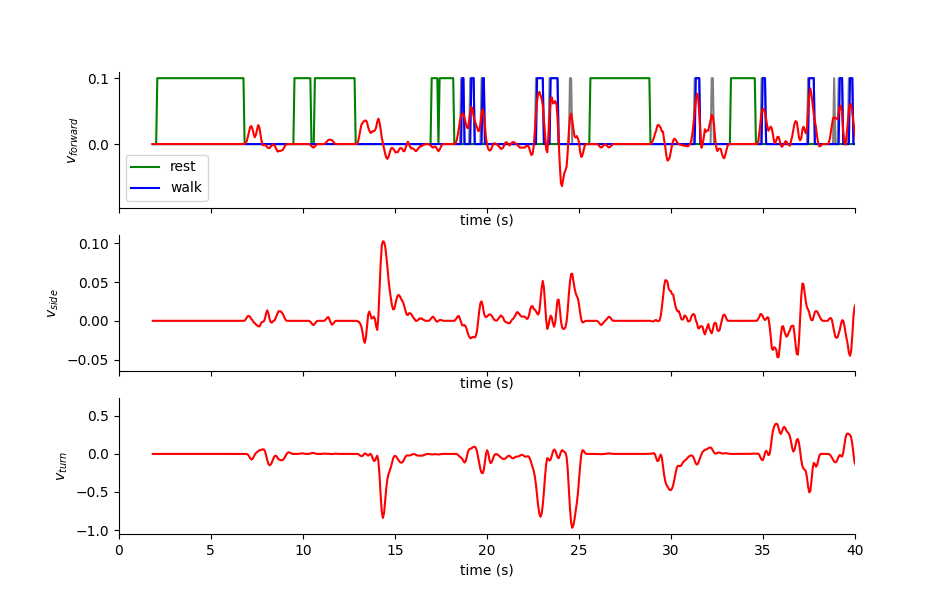

(0.0, 40.0)

In [87]:
%matplotlib notebook

alpha = 0.5

rest_red = np.logical_and.reduce((np.abs(v_f_red) <= 0.01, np.abs(v_s_red) <= 0.01, np.abs(v_t_red) <= 0.01))
rest_strict_red = np.logical_and(np.convolve(rest_red, np.ones(16)/16, mode="same") >= 0.75, rest_red)
walk_red = v_f_red >= 0.04
walk_strict_red = np.logical_and(np.convolve(walk_red, np.ones(4)/4, mode="same") >= 0.75, walk_red)



fig, axs = plt.subplots(3,1,figsize=(9.5,6), sharex=True, sharey=False)
# axs[0].plot(neural_df.t, rest_red*0.5,'k', alpha=0.5)
axs[0].plot(neural_df.t, rest_strict_red*0.1,'g', label="rest")
axs[0].plot(neural_df.t, walk_red*0.1,'k', alpha=0.5)
axs[0].plot(neural_df.t, walk_strict_red*0.1,'b', label="walk")
axs[0].plot(neural_df.t, v_f_red,'r')
axs[0].legend()
axs[0].set_xlabel("time (s)")
axs[0].set_ylabel("$v_{forward}$")
axs[1].plot(neural_df.t, v_s_red,'r')
axs[1].set_xlabel("time (s)")
axs[1].set_ylabel("$v_{side}$")
axs[2].plot(neural_df.t, v_t_red,'r')
axs[2].set_xlabel("time (s)")
axs[2].set_ylabel("$v_{turn}$")

for ax in axs:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    
ax.set_xlim([0,40])

In [17]:
print(np.mean(rest_strict_red))
print(np.mean(walk_strict_red))

0.3729166666666667
0.09713541666666667


# try out discriminative analysis for walking and resting within one trial

In [40]:
from longterm import analysis as an
an = reload(an)

In [70]:
neurons = neural_df.filter(regex="neuron").to_numpy()
neurons_mean = neurons.mean(axis=0)
neurons_std = neurons.std(axis=0)
neurons = (neurons - neurons_mean) / neurons_std
cov_neurons = an.cov(neurons)
sort_idx = an.cluster_corr(cov_neurons)
neurons = neurons[:,sort_idx]

neurons_walk = neurons[walk_strict_red, :]
neurons_rest = neurons[rest_strict_red, :]

In [71]:
cov_X, cov_X_walk, cov_X_rest, cov_X_intra, cov_X_inter = an.cov_pair(neurons_walk, neurons_rest)

<IPython.core.display.Javascript object>


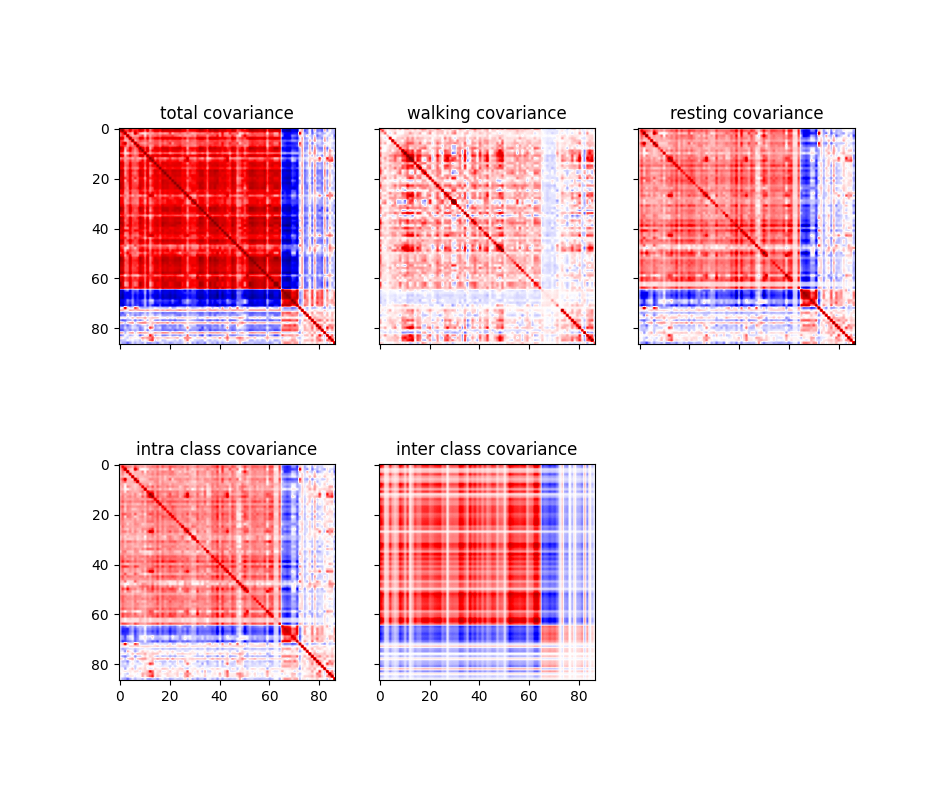

(-0.5, 86.5, 86.5, -0.5)

In [72]:
%matplotlib notebook
fig, axs = plt.subplots(2,3,figsize=(9.5, 8), sharex=True, sharey=True)
clim = [np.quantile(cov_X, 0.01), np.quantile(cov_X, 0.99)]
clim = [-1,1]
axs[0,0].imshow(cov_X, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[0,0].set_title("total covariance")
axs[0,1].imshow(cov_X_walk, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[0,1].set_title("walking covariance")
axs[0,2].imshow(cov_X_rest, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[0,2].set_title("resting covariance")
axs[1,0].imshow(cov_X_intra, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[1,0].set_title("intra class covariance")
axs[1,1].imshow(cov_X_inter, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[1,1].set_title("inter class covariance")
axs[1,2].axis("off")  # imshow(fraction, clim=[0,2], cmap=plt.cm.get_cmap("binary"))
# axs[1,2].set_title("fraction inter class covariance")

In [73]:
w_inter_pca = an.inter_condition_pca(neurons_walk, neurons_rest)
w_inter_lda = an.inter_condition_lda(neurons_walk, neurons_rest)
w_pca = an.pca(neurons, n=1).squeeze()

In [74]:
X_proj_walk_inter_pca = neurons_walk.dot(w_inter_pca)
X_proj_rest_inter_pca = neurons_rest.dot(w_inter_pca)
X_proj_walk_inter_lda = neurons_walk.dot(w_inter_lda)
X_proj_rest_inter_lda = neurons_rest.dot(w_inter_lda)
X_proj_walk_pca = neurons_walk.dot(-w_pca)
X_proj_rest_pca = neurons_rest.dot(-w_pca)

<IPython.core.display.Javascript object>


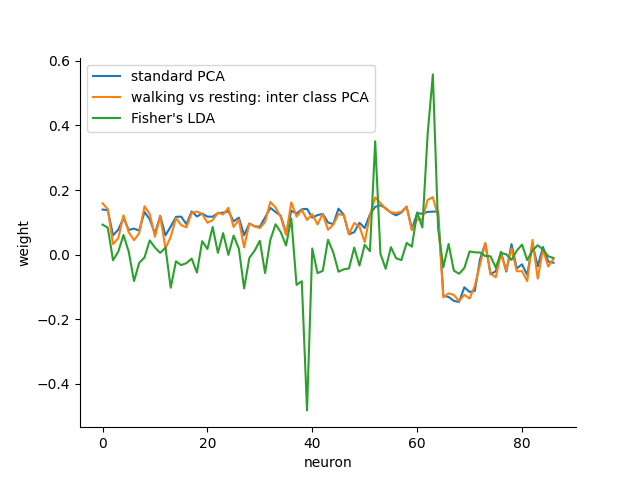

In [75]:
%matplotlib notebook

plt.plot(-w_pca, label="standard PCA")
plt.plot(w_inter_pca, label="walking vs resting: inter class PCA")
plt.plot(w_inter_lda, label="Fisher's LDA")
plt.xlabel("neuron")
plt.ylabel("weight")
plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)
plt.legend()

<IPython.core.display.Javascript object>


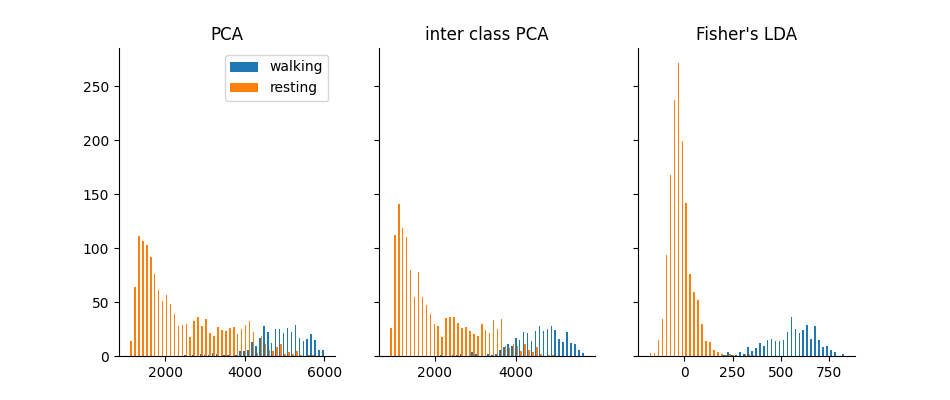

In [69]:
%matplotlib notebook
fig, axs = plt.subplots(1,3, figsize=(9.5, 4), sharey=True)
axs[1].hist([X_proj_walk_inter_pca, X_proj_rest_inter_pca], bins=50, label=["walking", "resting"])
axs[1].set_title("inter class PCA")


axs[2].hist([X_proj_walk_inter_lda, X_proj_rest_inter_lda], bins=50, label=["walking", "resting"])
axs[2].set_title("Fisher's LDA")

axs[0].hist([X_proj_walk_pca, X_proj_rest_pca], bins=50, label=["walking", "resting"])
axs[0].set_title("PCA")
axs[0].legend()
for ax in axs:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# now across all trials

In [88]:
fly_dir = os.path.join(load.NAS2_DIR_LH, "210512", "fly3")
trial_dirs = utils.readlines_tolist(os.path.join(fly_dir, "trial_dirs.txt"))
trial_dirs = [trial_dirs[i_trial] for i_trial in [0,2,3,5,8,11]]  # [2,5,11]  # 4
processed_dirs = [os.path.join(trial_dir, load.PROCESSED_FOLDER) for trial_dir in trial_dirs]
neural_df_dirs = [os.path.join(processed_dir, "twop_df.pkl") for processed_dir in processed_dirs]
neural_dfs = [pd.read_pickle(neural_df_dir) for neural_df_dir in neural_df_dirs]
opflow_df_dirs = [os.path.join(processed_dir, "opflow_df.pkl") for processed_dir in processed_dirs]
opflow_dfs = [pd.read_pickle(opflow_df_dir) for opflow_df_dir in opflow_df_dirs]
# beh_df_dirs = [os.path.join(processed_dir, "beh_df.pkl") for processed_dir in processed_dirs]
# beh_dfs = [pd.read_pickle(beh_df_dir) for beh_df_dir in beh_df_dirs]

<IPython.core.display.Javascript object>


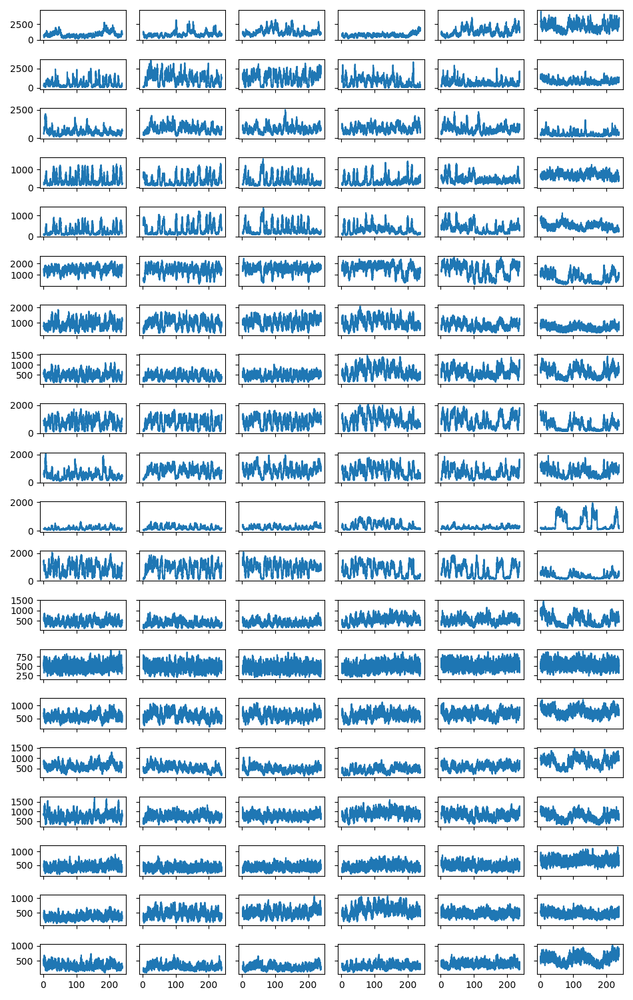

In [89]:
%matplotlib notebook

N_rows = 20
N_offset = 0  # 103  # 100  # 80  # 60  # 40  # 20

fig, axs = plt.subplots(nrows=N_rows, ncols=6, figsize=(9.5, 15), sharex=True, sharey="row")
for i_row, _axs in enumerate(axs):
    i_roi = N_offset + i_row
    for i_col, ax in enumerate(_axs):
        ax.plot(neural_dfs[i_col].t, neural_dfs[i_col].filter(regex="neuron").iloc[:, i_roi])
plt.tight_layout()

In [90]:
def opflow_filter(x, sigma=80):
    return np.convolve(x, np.ones((sigma))/sigma, mode="same")

v_fs = [opflow_filter(opflow_df.velForw) for opflow_df in opflow_dfs]
v_ss = [opflow_filter(opflow_df.velSide) for opflow_df in opflow_dfs]
v_ts = [opflow_filter(opflow_df.velTurn) for opflow_df in opflow_dfs]

In [91]:
v_f_reds = [synchronisation.reduce_during_2p_frame(twop_index=opflow_df.twop_index, 
                                                   values=np.expand_dims(v_f, axis=1))[:-1].squeeze() 
            for opflow_df, v_f in zip(opflow_dfs, v_fs)]
v_s_reds = [synchronisation.reduce_during_2p_frame(twop_index=opflow_df.twop_index, 
                                                   values=np.expand_dims(v_s, axis=1))[:-1].squeeze() 
            for opflow_df, v_s in zip(opflow_dfs, v_ss)]
v_t_reds = [synchronisation.reduce_during_2p_frame(twop_index=opflow_df.twop_index, 
                                                   values=np.expand_dims(v_t, axis=1))[:-1].squeeze() 
            for opflow_df, v_t in zip(opflow_dfs, v_ts)]

In [92]:
rest_reds = [np.logical_and.reduce((np.abs(v_f_red) <= 0.01, np.abs(v_s_red) <= 0.01, np.abs(v_t_red) <= 0.01)) 
             for v_f_red, v_s_red, v_t_red in zip(v_f_reds, v_s_reds, v_t_reds)]
rest_strict_reds = [np.logical_and(np.convolve(rest_red, np.ones(16)/16, mode="same") >= 0.75, rest_red) 
                    for rest_red in rest_reds]
walk_reds = [v_f_red >= 0.04 for v_f_red in v_f_reds]
walk_strict_reds = [np.logical_and(np.convolve(walk_red, np.ones(4)/4, mode="same") >= 0.75, walk_red) 
                    for walk_red in walk_reds]

In [93]:
print([np.mean(walk_strict_red) for walk_strict_red in walk_strict_reds])
print([np.mean(rest_strict_red) for rest_strict_red in rest_strict_reds])

[0.10494791666666667, 0.09713541666666667, 0.18203125, 0.3640625, 0.4354166666666667, 0.22786458333333334]
[0.34817708333333336, 0.3729166666666667, 0.32864583333333336, 0.19010416666666666, 0.1515625, 0.37421875]


In [94]:
neurons = [neural_df.filter(regex="neuron").to_numpy() for neural_df in neural_dfs]
neurons_mean = np.concatenate(neurons).mean(axis=0)
neurons_std = np.concatenate(neurons).std(axis=0)
neurons = [(neuron - neurons_mean) / neurons_std for neuron in neurons]
cov_neurons = an.cov(np.concatenate(neurons))
sort_idx = an.cluster_corr(cov_neurons)
neurons = [neuron[:,sort_idx] for neuron in neurons]

In [95]:
neurons_walk = [neuron[walk_strict_red, :] for neuron, walk_strict_red in zip(neurons, walk_strict_reds)]
neurons_rest = [neuron[rest_strict_red, :] for neuron, rest_strict_red in zip(neurons, rest_strict_reds)]

In [96]:
cov_X, cov_X_walk, cov_X_rest, cov_X_intra, cov_X_inter = an.cov_pair(np.concatenate(neurons_walk), np.concatenate(neurons_rest))

<IPython.core.display.Javascript object>


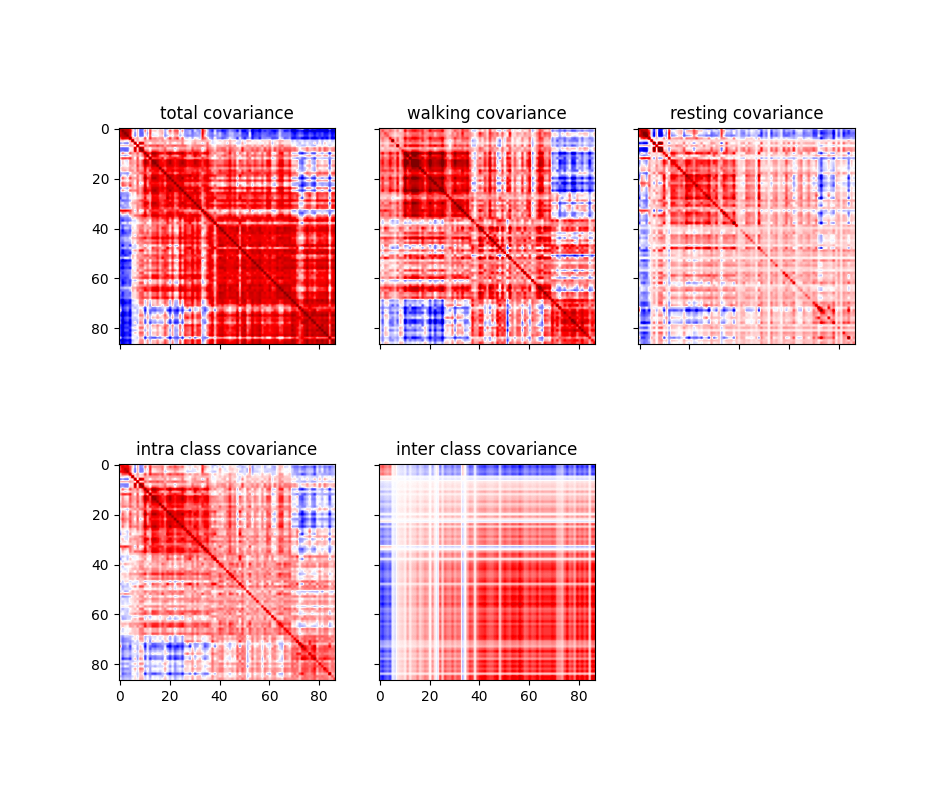

(-0.5, 86.5, 86.5, -0.5)

In [97]:
%matplotlib notebook
fig, axs = plt.subplots(2,3,figsize=(9.5, 8), sharex=True, sharey=True)
clim = [np.quantile(cov_X, 0.01), np.quantile(cov_X, 0.99)]
clim = [-1,1]
axs[0,0].imshow(cov_X, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[0,0].set_title("total covariance")
axs[0,1].imshow(cov_X_walk, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[0,1].set_title("walking covariance")
axs[0,2].imshow(cov_X_rest, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[0,2].set_title("resting covariance")
axs[1,0].imshow(cov_X_intra, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[1,0].set_title("intra class covariance")
axs[1,1].imshow(cov_X_inter, clim=clim, cmap=plt.cm.get_cmap("seismic"))
axs[1,1].set_title("inter class covariance")
axs[1,2].axis("off")  # imshow(fraction, clim=[0,2], cmap=plt.cm.get_cmap("binary"))
# axs[1,2].set_title("fraction inter class covariance")

In [98]:
w_inter_pca = an.inter_condition_pca(np.concatenate(neurons_walk), np.concatenate(neurons_rest))
w_inter_lda = an.inter_condition_lda(np.concatenate(neurons_walk), np.concatenate(neurons_rest))
w_pca = an.pca(np.concatenate(neurons), n=1).squeeze()

In [102]:
X_proj_walk_inter_pca = np.concatenate(neurons_walk).dot(w_inter_pca)
X_proj_rest_inter_pca = np.concatenate(neurons_rest).dot(w_inter_pca)
X_proj_walk_inter_lda = np.concatenate(neurons_walk).dot(w_inter_lda)
X_proj_rest_inter_lda = np.concatenate(neurons_rest).dot(w_inter_lda)
X_proj_walk_pca = np.concatenate(neurons_walk).dot(-w_pca)
X_proj_rest_pca = np.concatenate(neurons_rest).dot(-w_pca)

<IPython.core.display.Javascript object>


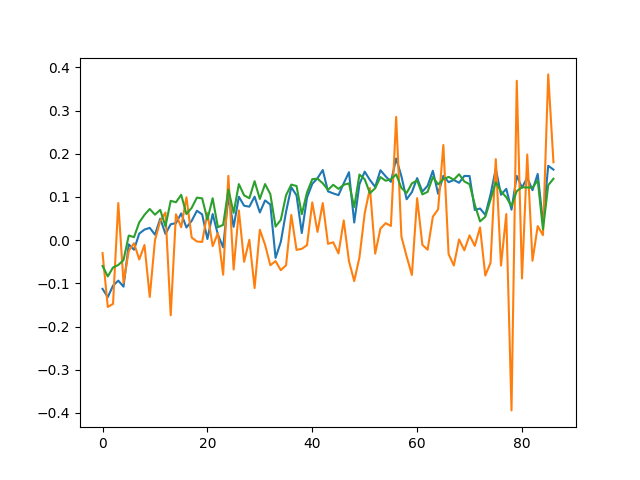

In [103]:
%matplotlib notebook
plt.plot(w_inter_pca)
plt.plot(w_inter_lda)
plt.plot(-w_pca)

<IPython.core.display.Javascript object>


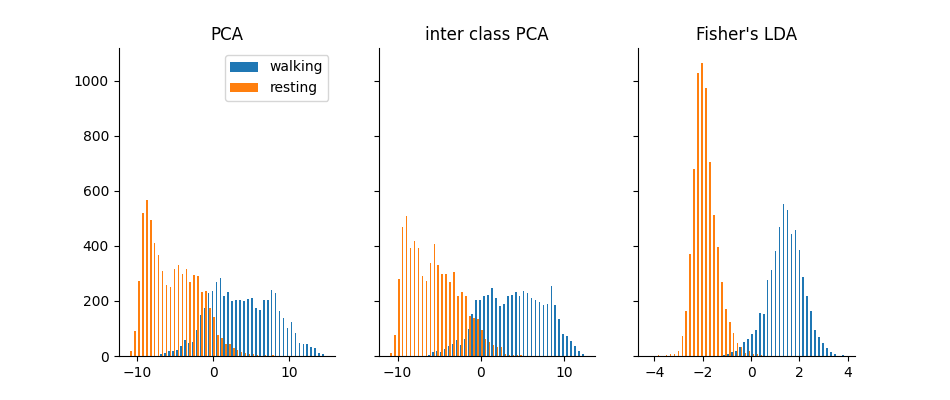

In [104]:
fig, axs = plt.subplots(1,3, figsize=(9.5, 4), sharey=True)
axs[1].hist([X_proj_walk_inter_pca, X_proj_rest_inter_pca], bins=50, label=["walking", "resting"])
axs[1].set_title("inter class PCA")


axs[2].hist([X_proj_walk_inter_lda, X_proj_rest_inter_lda], bins=50, label=["walking", "resting"])
axs[2].set_title("Fisher's LDA")

axs[0].hist([X_proj_walk_pca, X_proj_rest_pca], bins=50, label=["walking", "resting"])
axs[0].set_title("PCA")
axs[0].legend()
for ax in axs:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# now compare between trials

In [121]:
cov_matrix_walk, cov_total_walk, cov_intra_walk, cov_inter_walk = an.all_cov_pairs(neurons_walk)
cov_matrix_rest, cov_total_rest, cov_intra_rest, cov_inter_rest = an.all_cov_pairs(neurons_rest)

In [122]:
def plot_cov_matrix(cov_matrix, trials, name="", figsize=(9.5,10), clim=None):
    N_trials = len(trials)
    fig, axs = plt.subplots(N_trials, N_trials, figsize=figsize, sharex=True, sharey=True)
    for i_row, axs_ in enumerate(axs):
        for i_col, ax in enumerate(axs_):
            im = cov_matrix[i_row, i_col, :, :]
            if clim is None and i_row == 0 and i_col==0:
                clim = [np.quantile(im, 0.01), np.quantile(im, 0.99)]
            ax.imshow(im, cmap=plt.cm.get_cmap("seismic"), clim=clim)
            if i_col == i_row:
                ax.set_title("covariance trial {}".format(trials[i_row]))
            elif i_col > i_row:
                ax.set_title("intra trial {} and {}".format(trials[i_col], trials[i_row]))
            elif i_col < i_row:
                ax.set_title("inter trial {} and {}".format(trials[i_col], trials[i_row]))
    fig.suptitle(name)

<IPython.core.display.Javascript object>


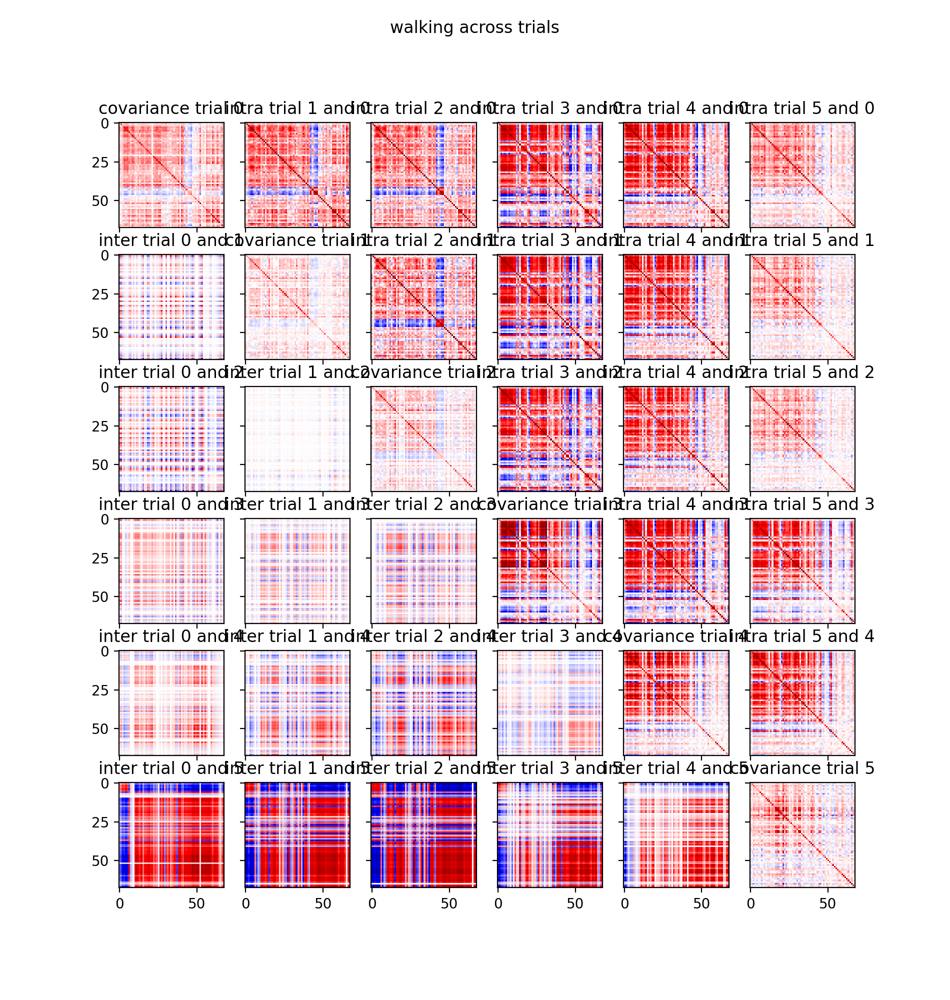

In [123]:
%matplotlib notebook
plot_cov_matrix(cov_matrix_walk, trials=[0,1,2,3,4,5], name="walking across trials", clim=[-1,1])  # [2,6,10]

<IPython.core.display.Javascript object>


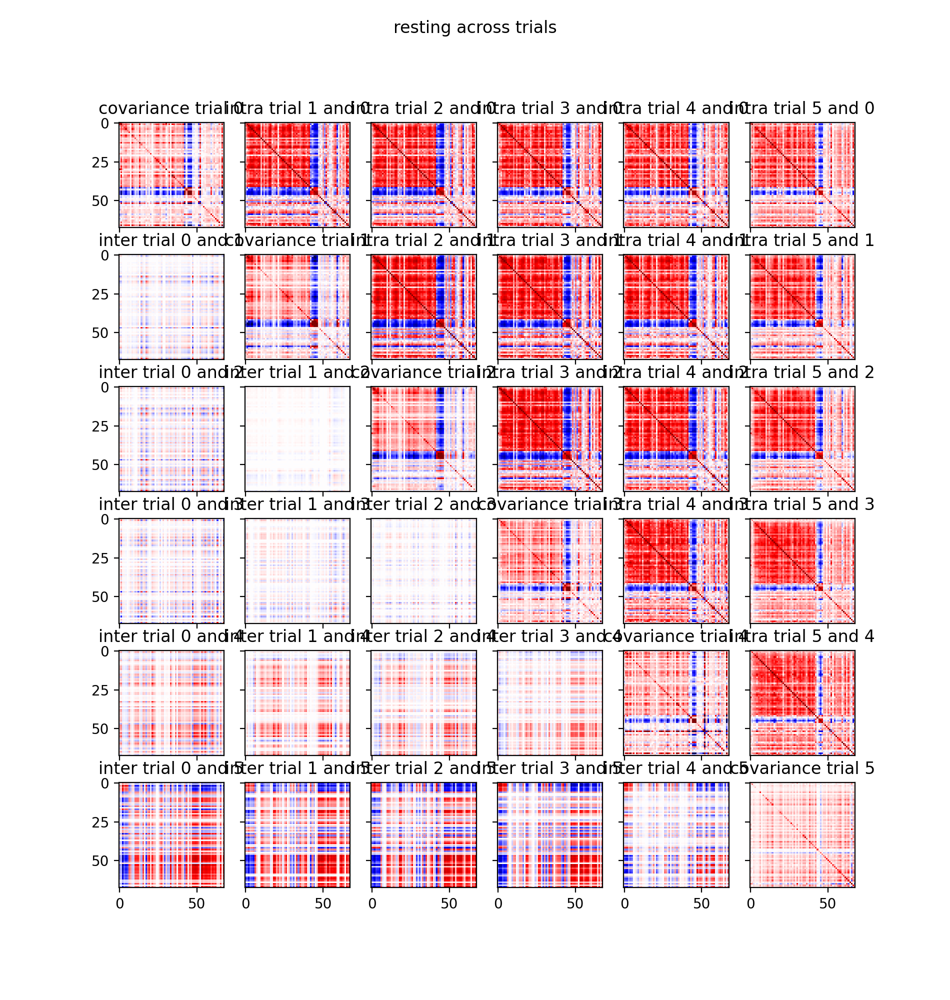

In [124]:
%matplotlib notebook
plot_cov_matrix(cov_matrix_rest, trials=[0,1,2,3,4,5], name="resting across trials", clim=[-1,1])  # [2,6,10]

In [109]:
w_inter_pca_walk, w_inter_lda_walk, w_pca_walk = an.all_inter_condition_pairs(neurons_walk)
w_inter_pca_rest, w_inter_lda_rest, w_pca_rest = an.all_inter_condition_pairs(neurons_rest)

In [128]:
def plot_all_hists(w_matrix, X_trials, trials, name="", X_names=None, figsize=(9.5,10), clim=None):
    N_trials = len(trials)
    X_names = trials if X_names is None else X_names
    fig, axs = plt.subplots(N_trials-1, N_trials-1, figsize=figsize)  # , sharex=True, sharey=True)
    for i_row, axs_ in enumerate(axs):
        for i_col, ax in enumerate(axs_):
            i_col += 1
            if i_col > i_row:
                w = w_matrix[i_row, i_col]
                X_proj = [X_trials[trial].dot(w) for trial in trials]
                ax.hist(X_proj, bins=20, label=X_names)
                means = [np.mean(X_) for X_ in X_proj]
                # print(means)
                ax.set_prop_cycle(None)
                _ = [ax.scatter(mean, -100, s=100) for mean in means]
                ax.set_title("dir "+str(X_names[i_row])+" & "+str(X_names[i_col]))
                if i_row == 0 and i_col == 1:
                    ax.legend(frameon=False)  # , bbox_to_anchor=(1, 0.5))
                ax.set_yticks([])
                ax.spines["top"].set_visible(False)
                ax.spines["right"].set_visible(False)
                ax.spines["left"].set_visible(False)
                # ax.set_yscale("log")
            else:
                ax.axis("off")
            
    fig.suptitle(name)
    fig.tight_layout()

<IPython.core.display.Javascript object>


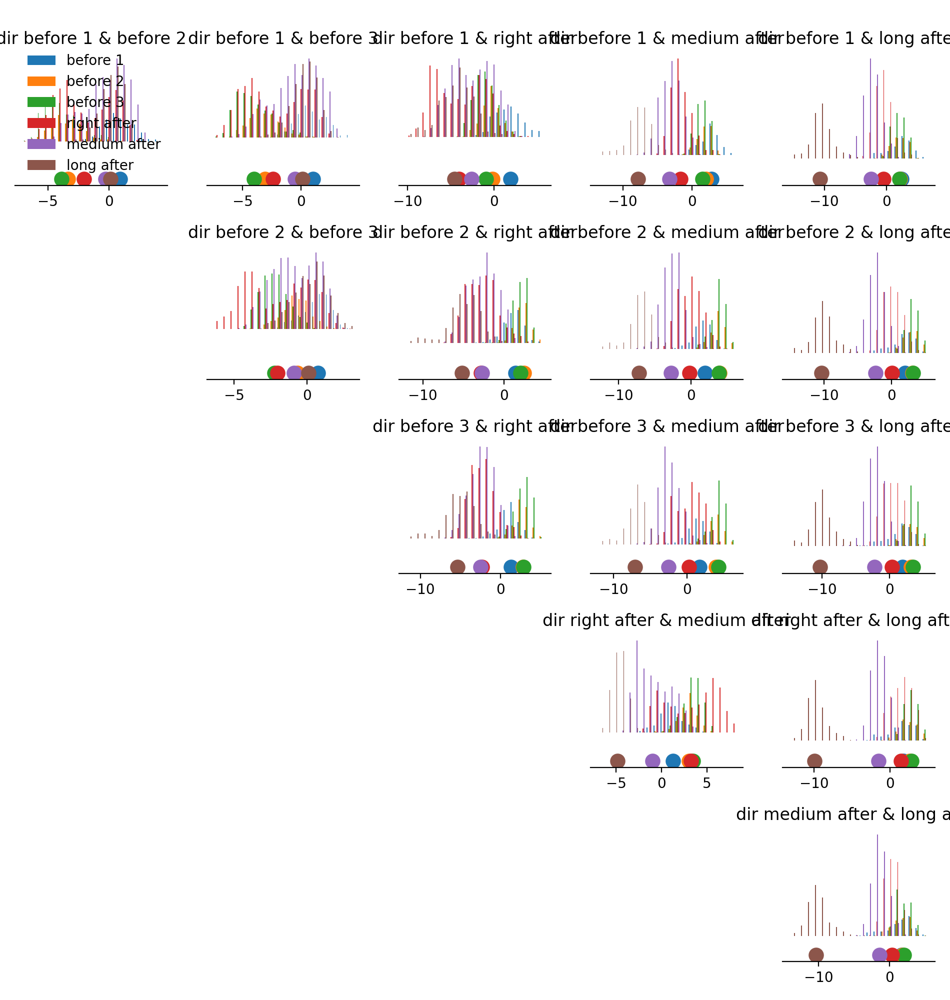

In [129]:
%matplotlib notebook
plot_all_hists(w_inter_pca_walk, neurons_walk, trials=np.arange(6), 
               X_names=["before 1", "before 2", "before 3", "right after", "medium after", "long after"])

In [113]:
from importlib import reload

In [120]:
an = reload(an)
from longterm import plot as myplt
myplt = reload(myplt)

<IPython.core.display.Javascript object>


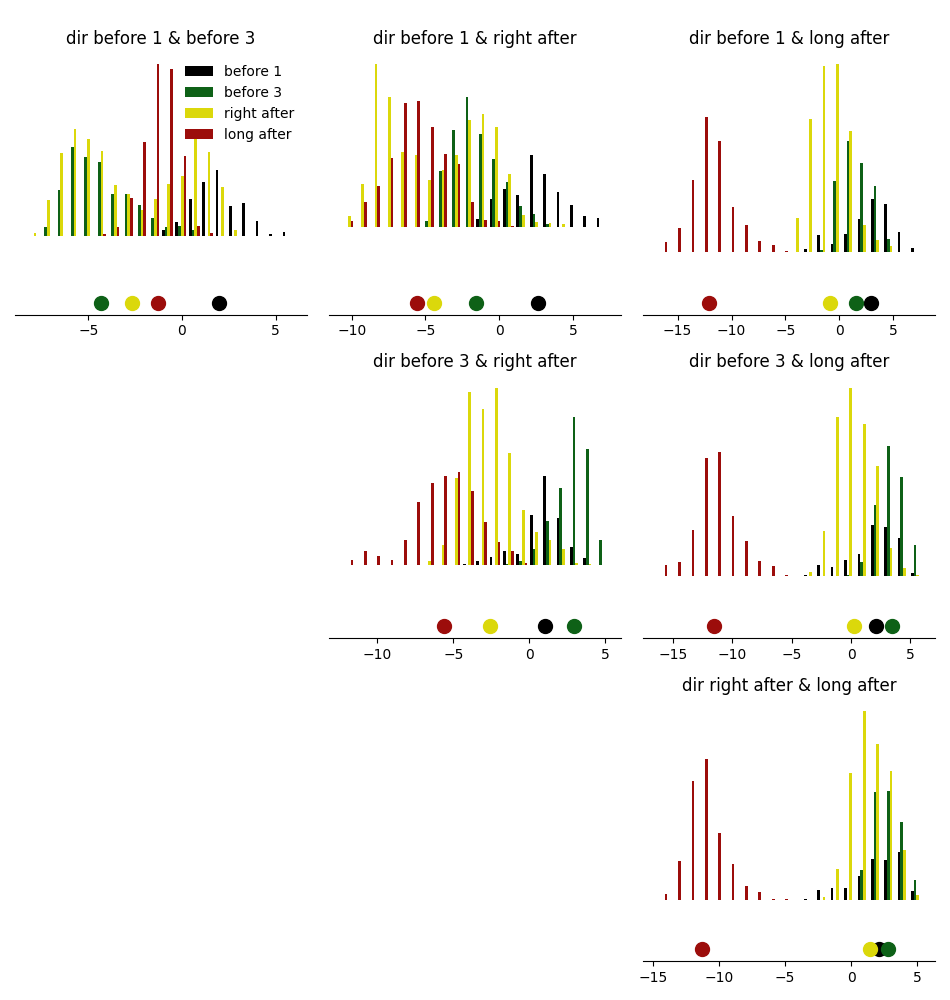

In [122]:
%matplotlib notebook
colors = [myplt.BLACK, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKRED]
an.plot_proj_hists(w_inter_pca_walk, neurons_walk, trials=[0,2,3,5], 
               X_names=["before 1", "before 3", "right after", "long after"], colors=colors)

<IPython.core.display.Javascript object>


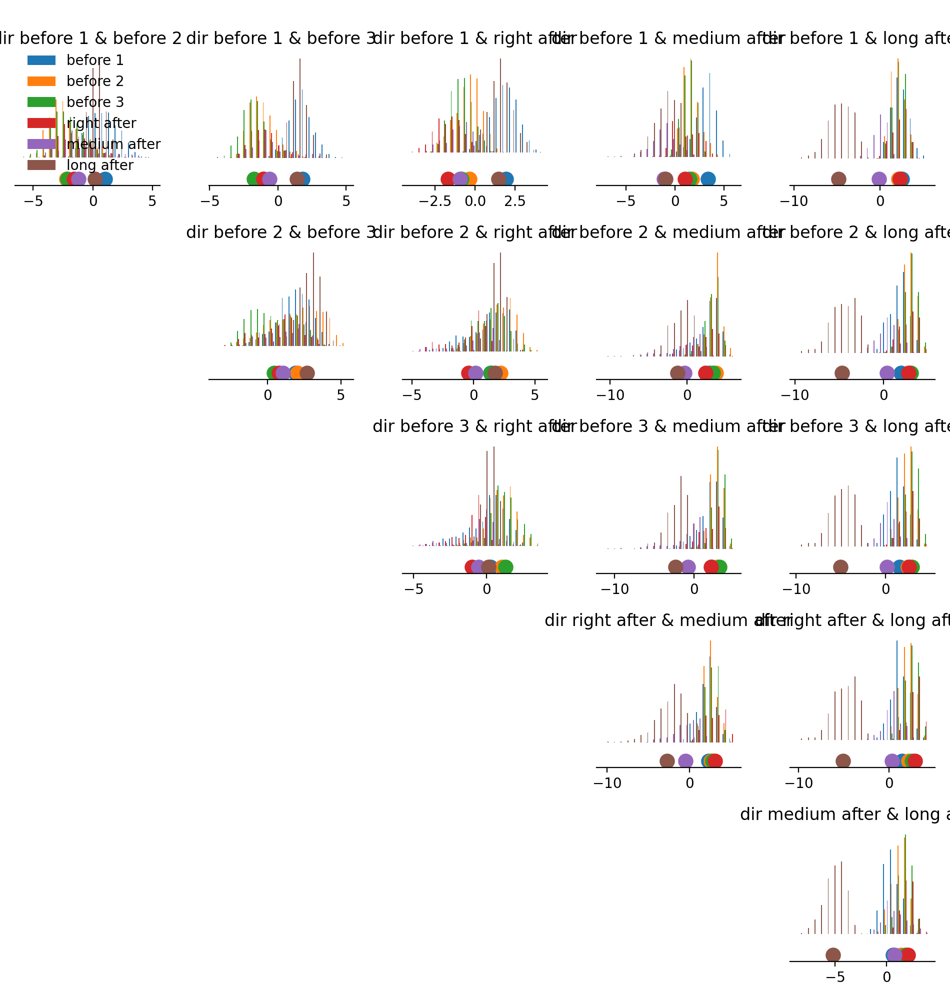

In [130]:
%matplotlib notebook
plot_all_hists(w_inter_pca_rest, neurons_rest, trials=np.arange(6), 
               X_names=["before 1", "before 2", "before 3", "right after", "medium after", "long after"])

In [157]:
plt.rcParams['axes.prop_cycle'].by_key()['color']

['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

In [126]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms
# modified from https://matplotlib.org/3.1.1/gallery/statistics/confidence_ellipse.html#sphx-glr-gallery-statistics-confidence-ellipse-py
def confidence_ellipse(x, y, ax, color, n_std=2.0, facecolor='none', **kwargs):
    """
    Create a plot of the covariance confidence ellipse of `x` and `y`

    Parameters
    ----------
    x, y : array_like, shape (n, )
        Input data.

    ax : matplotlib.axes.Axes
        The axes object to draw the ellipse into.

    n_std : float
        The number of standard deviations to determine the ellipse's radiuses.

    Returns
    -------
    matplotlib.patches.Ellipse

    Other parameters
    ----------------
    kwargs : `~matplotlib.patches.Patch` properties
    """
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    # Using a special case to obtain the eigenvalues of this
    # two-dimensionl dataset.
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0),
        width=ell_radius_x * 2,
        height=ell_radius_y * 2,
        facecolor=facecolor,
        edgecolor=color,
        **kwargs)

    # Calculating the stdandard deviation of x from
    # the squareroot of the variance and multiplying
    # with the given number of standard deviations.
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)

    # calculating the stdandard deviation of y ...
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)

    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    return ax.add_patch(ellipse)

In [127]:
def plot_scatter(w_1, w_2, X_trials, trials, name="", w_names = [None, None], X_names=None, 
                 figsize=(9.5,10), alpha=0.01, fig=None, ax=None, legendpos=None, colors=None):
    N_trials = len(trials)
    X_names = trials if X_names is None else X_names
    if fig is None and ax is None:
        fig, ax = plt.subplots(1, 1, figsize=figsize)  # , sharex=True, sharey=True)
    xs = [X_trials[trial].dot(w_1) for trial in trials]
    ys = [X_trials[trial].dot(w_2) for trial in trials]
    X_names = [None for trial in trials] if X_names is None else X_names
    if colors is None:
        colors = plt.rcParams['axes.prop_cycle'].by_key()['color'][:N_trials]
    _ = [ax.scatter(x,y, alpha=alpha, color=color) for x,y,x_name, color in zip(xs, ys, X_names, colors)]
    _ = [ax.scatter(np.mean(x),np.mean(y), label=x_name, alpha=1, s=100, color=color, edgecolors="white") 
         for x,y,x_name, color in zip(xs, ys, X_names, colors)]
    _ = [confidence_ellipse(x,y, ax=ax, color=color) 
         for x,y,x_name, color in zip(xs, ys, X_names, colors)]
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    if legendpos is None:
        ax.legend(frameon=False)
    else:
        ax.legend(frameon=False, loc=legendpos)
    ax.set_xlabel(w_names[0])
    ax.set_ylabel(w_names[1])
            
    ax.set_title(name)
    fig.tight_layout()

In [128]:
from longterm import plot as myplt
myplt = reload(myplt)

<IPython.core.display.Javascript object>


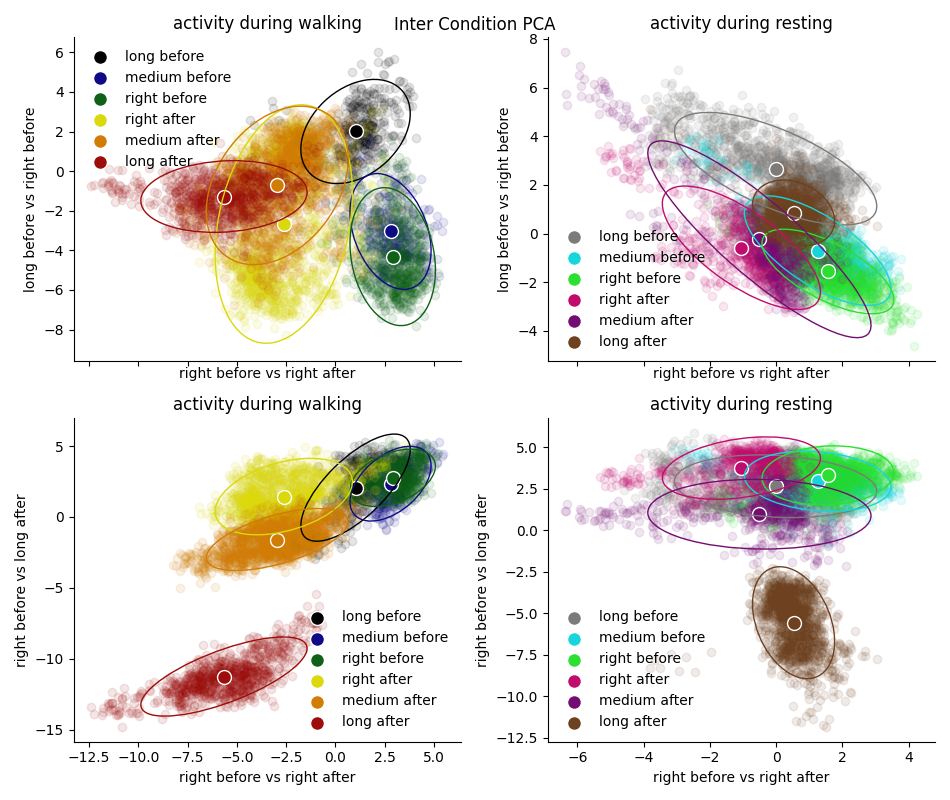

Text(0.5, 0.98, 'Inter Condition PCA')

In [129]:
%matplotlib notebook

colors = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]


fig, axs = plt.subplots(2,2, figsize=(9.5,8), sharex="col")  # , sharey="row")
plot_scatter(w_1=w_inter_pca_walk[2,3], w_2=w_inter_pca_walk[0,2],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "long before vs right before"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[0,0], alpha=0.1, name="activity during walking",colors=colors)
plot_scatter(w_1=w_inter_pca_rest[2,3], w_2=w_inter_pca_rest[0,2],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "long before vs right before"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[0,1], alpha=0.1, name="activity during resting",colors=colors_contrast)

plot_scatter(w_1=w_inter_pca_walk[2,3], w_2=w_inter_pca_walk[3,5],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "right before vs long after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[1,0], alpha=0.1, name="activity during walking",colors=colors)
plot_scatter(w_1=w_inter_pca_rest[2,3], w_2=w_inter_pca_rest[3,5],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "right before vs long after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[1,1], alpha=0.1, name="activity during resting",colors=colors_contrast)

fig.suptitle("Inter Condition PCA")

<IPython.core.display.Javascript object>


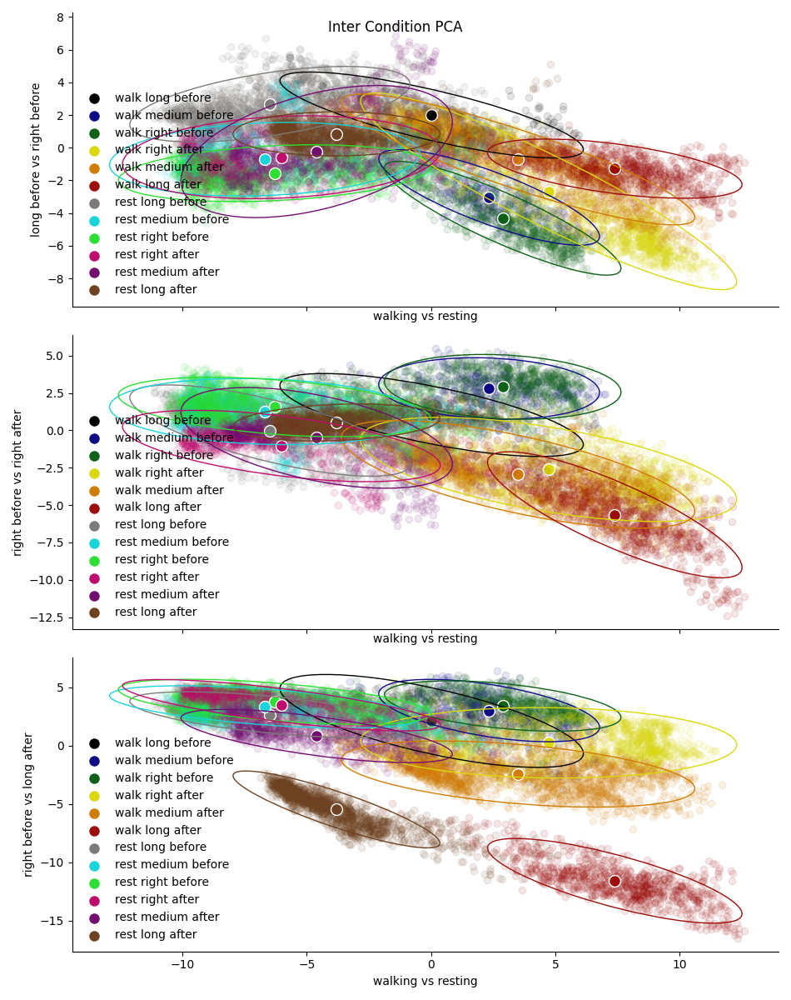

Text(0.5, 0.98, 'Inter Condition PCA')

In [130]:
%matplotlib notebook

colors = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]

fig, axs = plt.subplots(3,1, figsize=(9.5,12), sharex="col")  # , sharey="row")

plot_scatter(w_1=w_inter_pca, w_2=w_inter_pca_walk[0,2],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "long before vs right before"],
             X_names=["walk long before", "walk medium before", "walk right before", \
                      "walk right after", "walk medium after", "walk long after"], 
             fig=fig, ax=axs[0], alpha=0.1, name="",
             colors=colors)
plot_scatter(w_1=w_inter_pca, w_2=w_inter_pca_rest[0,2],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "long before vs right before"],
             X_names=["rest long before", "rest medium before", "rest right before", \
                      "rest right after", "rest medium after", "rest long after"], 
             fig=fig, ax=axs[0], alpha=0.1, name="",legendpos="lower left",
             colors=colors_contrast)

plot_scatter(w_1=w_inter_pca, w_2=w_inter_pca_walk[2,3],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs right after"],
             X_names=["walk long before", "walk medium before", "walk right before", \
                      "walk right after", "walk medium after", "walk long after"], 
             fig=fig, ax=axs[1], alpha=0.1, name="",
             colors=colors)
plot_scatter(w_1=w_inter_pca, w_2=w_inter_pca_rest[2,3],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs right after"],
             X_names=["rest long before", "rest medium before", "rest right before", \
                      "rest right after", "rest medium after", "rest long after"], 
             fig=fig, ax=axs[1], alpha=0.1, name="",legendpos="lower left",
             colors=colors_contrast)

plot_scatter(w_1=w_inter_pca, w_2=w_inter_pca_walk[2,5],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs long after"],
             X_names=["walk long before", "walk medium before", "walk right before", \
                      "walk right after", "walk medium after", "walk long after"], 
             fig=fig, ax=axs[2], alpha=0.1, name="",
             colors=colors)
plot_scatter(w_1=w_inter_pca, w_2=w_inter_pca_rest[2,5],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs long after"],
             X_names=["rest long before", "rest medium before", "rest right before", \
                      "rest right after", "rest medium after", "rest long after"], 
             fig=fig, ax=axs[2], alpha=0.1, name="",legendpos="lower left",
             colors=colors_contrast)
fig.suptitle("Inter Condition PCA")

<IPython.core.display.Javascript object>


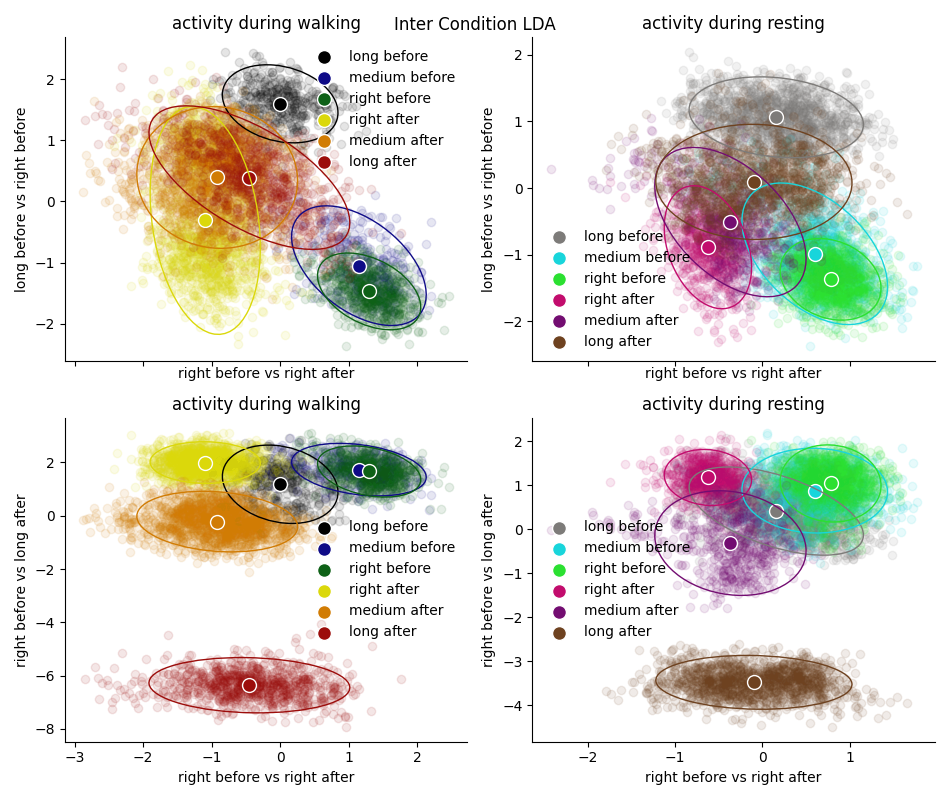

Text(0.5, 0.98, 'Inter Condition LDA')

In [131]:
%matplotlib notebook

colors = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]


fig, axs = plt.subplots(2,2, figsize=(9.5,8), sharex="col")  # , sharey="row")
plot_scatter(w_1=w_inter_lda_walk[2,3], w_2=w_inter_lda_walk[0,2],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "long before vs right before"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[0,0], alpha=0.1, name="activity during walking",colors=colors)
plot_scatter(w_1=w_inter_lda_rest[2,3], w_2=w_inter_lda_rest[0,2],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "long before vs right before"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[0,1], alpha=0.1, name="activity during resting",colors=colors_contrast)

plot_scatter(w_1=w_inter_lda_walk[2,3], w_2=w_inter_lda_walk[3,5],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "right before vs long after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[1,0], alpha=0.1, name="activity during walking",colors=colors)
plot_scatter(w_1=w_inter_lda_rest[2,3], w_2=w_inter_lda_rest[3,5],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["right before vs right after", "right before vs long after"],
             X_names=["long before","medium before", "right before", "right after", "medium after", "long after"], 
             fig=fig, ax=axs[1,1], alpha=0.1, name="activity during resting",colors=colors_contrast)

fig.suptitle("Inter Condition LDA")

<IPython.core.display.Javascript object>


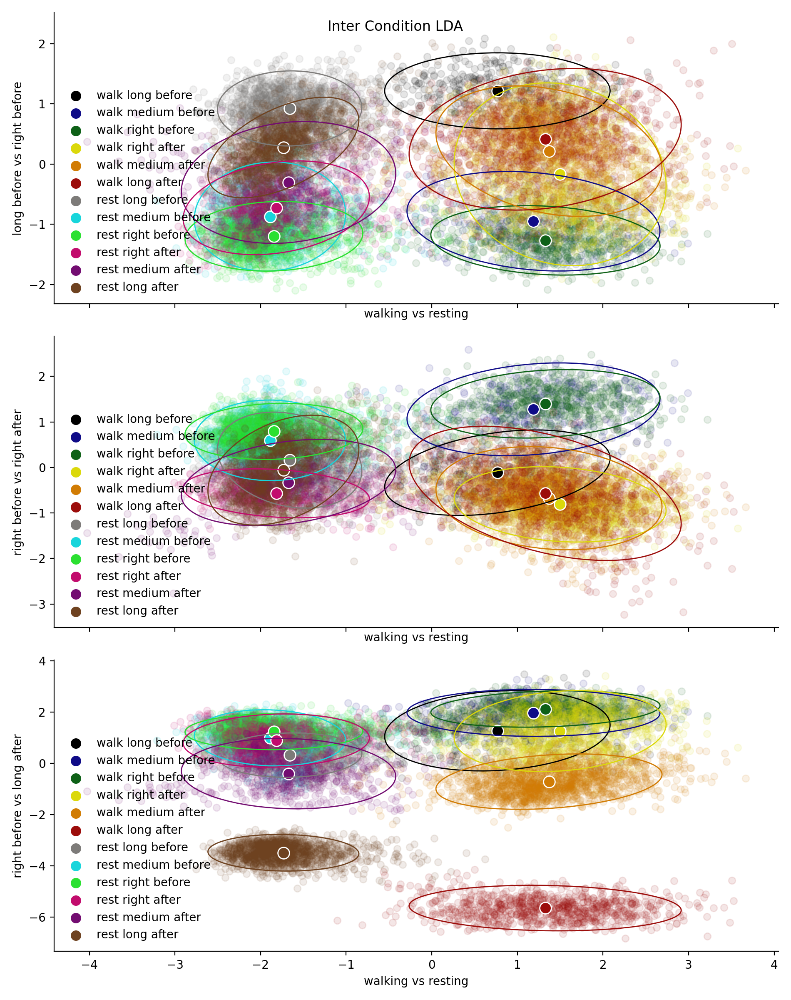

Text(0.5, 0.98, 'Inter Condition LDA')

In [181]:
%matplotlib notebook

colors = [myplt.BLACK, myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKYELLOW, myplt.DARKORANGE, myplt.DARKRED]
colors_contrast = [myplt.DARKGRAY, myplt.DARKBLUE_CONTRAST, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK, myplt.DARKPURPLE, myplt.DARKBROWN]

fig, axs = plt.subplots(3,1, figsize=(9.5,12), sharex="col")  # , sharey="row")

plot_scatter(w_1=w_inter_lda, w_2=w_inter_lda_walk[0,2],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "long before vs right before"],
             X_names=["walk long before", "walk medium before", "walk right before", \
                      "walk right after", "walk medium after", "walk long after"], 
             fig=fig, ax=axs[0], alpha=0.1, name="",
             colors=colors)
plot_scatter(w_1=w_inter_lda, w_2=w_inter_lda_rest[0,2],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "long before vs right before"],
             X_names=["rest long before", "rest medium before", "rest right before", \
                      "rest right after", "rest medium after", "rest long after"], 
             fig=fig, ax=axs[0], alpha=0.1, name="",legendpos="lower left",
             colors=colors_contrast)

plot_scatter(w_1=w_inter_lda, w_2=w_inter_lda_walk[2,3],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs right after"],
             X_names=["walk long before", "walk medium before", "walk right before", \
                      "walk right after", "walk medium after", "walk long after"], 
             fig=fig, ax=axs[1], alpha=0.1, name="",
             colors=colors)
plot_scatter(w_1=w_inter_lda, w_2=w_inter_lda_rest[2,3],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs right after"],
             X_names=["rest long before", "rest medium before", "rest right before", \
                      "rest right after", "rest medium after", "rest long after"], 
             fig=fig, ax=axs[1], alpha=0.1, name="",legendpos="lower left",
             colors=colors_contrast)

plot_scatter(w_1=w_inter_lda, w_2=w_inter_lda_walk[2,5],
             X_trials=neurons_walk, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs long after"],
             X_names=["walk long before", "walk medium before", "walk right before", \
                      "walk right after", "walk medium after", "walk long after"], 
             fig=fig, ax=axs[2], alpha=0.1, name="",
             colors=colors)
plot_scatter(w_1=w_inter_lda, w_2=w_inter_lda_rest[2,5],
             X_trials=neurons_rest, trials=[0,1,2,3,4,5], w_names=["walking vs resting", "right before vs long after"],
             X_names=["rest long before", "rest medium before", "rest right before", \
                      "rest right after", "rest medium after", "rest long after"], 
             fig=fig, ax=axs[2], alpha=0.1, name="",legendpos="lower left",
             colors=colors_contrast)
fig.suptitle("Inter Condition LDA")

# now try with whole dff videos instead of ROI signals

In [55]:
neural_data_dirs = [os.path.join(processed_dir, "green_denoised_t1.tif") for processed_dir in processed_dirs]
neural_datas = [utils.get_stack(neural_data_dir) for neural_data_dir in neural_data_dirs]
neural_datas = [neural_data[:, 25:305, 110:520] for neural_data in neural_datas]

In [56]:
neural_flat_datas = [np.reshape(neural_data, (neural_data.shape[0], -1)) for neural_data in neural_datas]

In [57]:
neurons_mean = np.concatenate(neural_flat_datas).mean(axis=0)
neurons_std = np.concatenate(neural_flat_datas).std(axis=0)
neural_flat_datas = [(neural_flat_data - neurons_mean) / neurons_std for neural_flat_data in neural_flat_datas]

In [58]:
neural_flat_datas_walk = [neuron[walk_strict_red, :] for neuron, walk_strict_red in zip(neural_flat_datas, walk_strict_reds)]
neural_flat_datas_rest = [neuron[rest_strict_red, :] for neuron, rest_strict_red in zip(neural_flat_datas, rest_strict_reds)]

In [89]:
w_inter_pca_walk_1 = an.inter_condition_pca(neural_flat_datas_walk[0], neural_flat_datas_walk[1])
w_inter_pca_walk_2 = an.inter_condition_pca(neural_flat_datas_walk[0], neural_flat_datas_walk[2])
w_inter_pca_rest_1 = an.inter_condition_pca(neural_flat_datas_rest[0], neural_flat_datas_rest[1])
w_inter_pca_rest_2 = an.inter_condition_pca(neural_flat_datas_rest[0], neural_flat_datas_rest[2])
w_inter_pca_walk_rest = an.inter_condition_pca(np.concatenate(neural_flat_datas_rest, axis=0), np.concatenate(neural_flat_datas_rest, axis=0))

In [82]:
i_sort = np.argsort(w_inter_pca_walk_1)

<IPython.core.display.Javascript object>


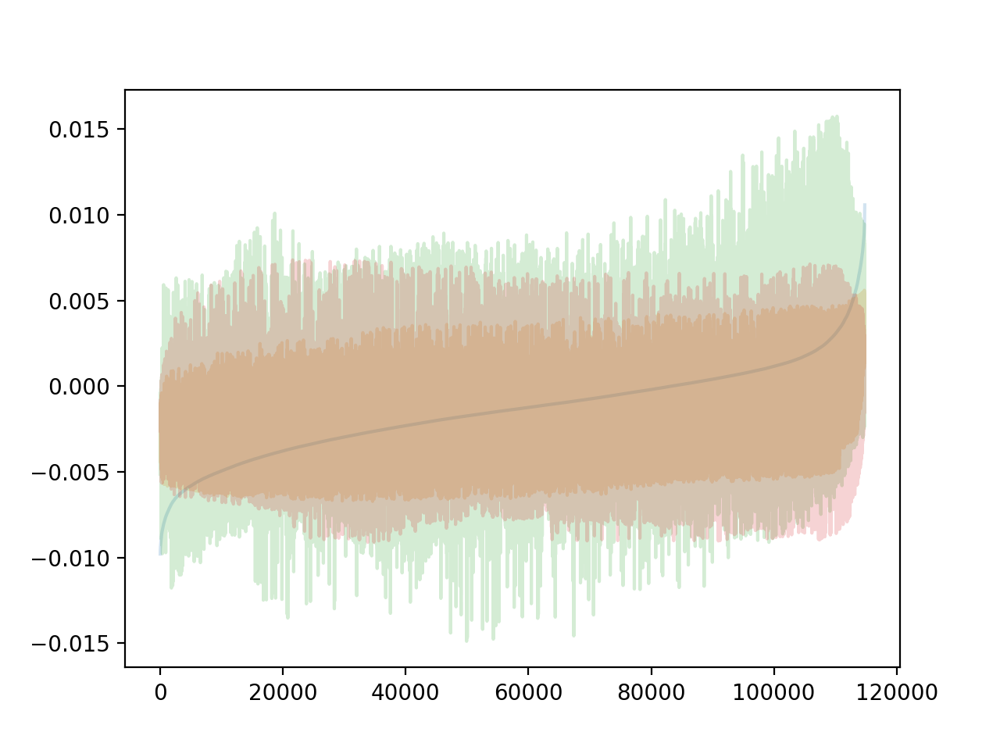

In [91]:
%matplotlib notebook
plt.plot(w_inter_pca_walk_1[i_sort], alpha=0.2)
plt.plot(w_inter_pca_walk_2[i_sort], alpha=0.2)
plt.plot(w_inter_pca_rest_1[i_sort], alpha=0.2)
plt.plot(w_inter_pca_rest_2[i_sort], alpha=0.2)
plt.plot(w_inter_pca_walk_rest[i_sort], alpha=0.2)

<IPython.core.display.Javascript object>


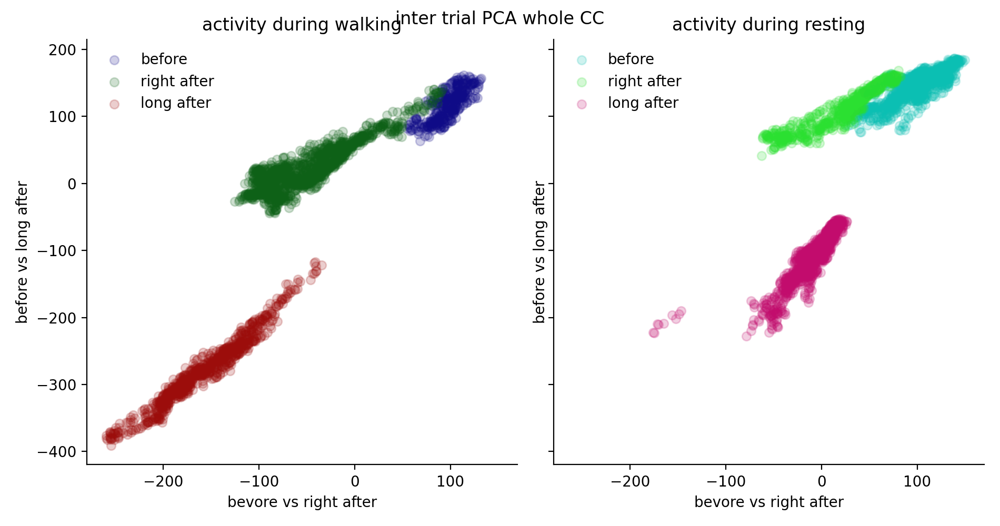

Text(0.5, 0.98, 'inter trial PCA whole CC')

In [101]:
%matplotlib notebook

colors = [myplt.DARKBLUE, myplt.DARKGREEN, myplt.DARKRED]
colors_contrast = [myplt.DARKCYAN, myplt.DARKGREEN_CONTRAST, myplt.DARKPINK]

fig, axs = plt.subplots(1, 2, figsize=(9.5,5), sharex="row", sharey="row")
plot_scatter(w_1=w_inter_pca_walk_1, w_2=w_inter_pca_walk_2,
             X_trials=neural_flat_datas_walk, trials=[0,1,2], w_names=["bevore vs right after", "before vs long after"],
             X_names=["before", "right after", "long after"], 
             fig=fig, ax=axs[0], alpha=0.2, name="activity during walking",
             colors=colors)
plot_scatter(w_1=w_inter_pca_rest_1, w_2=w_inter_pca_rest_2,
             X_trials=neural_flat_datas_rest, trials=[0,1,2], w_names=["bevore vs right after", "before vs long after"],
             X_names=["before", "right after", "long after"], 
             fig=fig, ax=axs[1], alpha=0.2, name="activity during resting",
             colors=colors_contrast)
"""
plot_scatter(w_1=w_pca, w_2=w_pca_walk[0,1],
             X_trials=neurons_walk, trials=[0,1,2], w_names=["walking vs resting", "before vs right after"],
             X_names=["walk before", "walk right after", "walk long after"], 
             fig=fig, ax=axs[1,0], alpha=0.2, name="",
             colors=colors)
plot_scatter(w_1=w_pca, w_2=w_pca_rest[0,1],
             X_trials=neurons_rest, trials=[0,1,2], w_names=["walking vs resting", "before vs right after"],
             X_names=["rest before", "rest right after", "rest long after"], 
             fig=fig, ax=axs[1,0], alpha=0.2, name="walking and resting right after", legendpos="lower left",
             colors=colors_contrast)

plot_scatter(w_1=w_pca, w_2=w_pca_walk[0,2],
             X_trials=neurons_walk, trials=[0,1,2], w_names=["walking vs resting", "before vs long after"],
             X_names=["walk before", "walk right after", "walk long after"], 
             fig=fig, ax=axs[1,1], alpha=0.2, name="",
             colors=colors)
plot_scatter(w_1=w_pca, w_2=w_pca_rest[0,2],
             X_trials=neurons_rest, trials=[0,1,2], w_names=["walking vs resting", "before vs long after"],
             X_names=["rest before", "rest right after", "rest long after"], 
             fig=fig, ax=axs[1,1], alpha=0.2, name="walking and resting long after", legendpos="lower left",
             colors=colors_contrast)
"""
fig.suptitle("inter trial PCA whole CC")

<IPython.core.display.Javascript object>


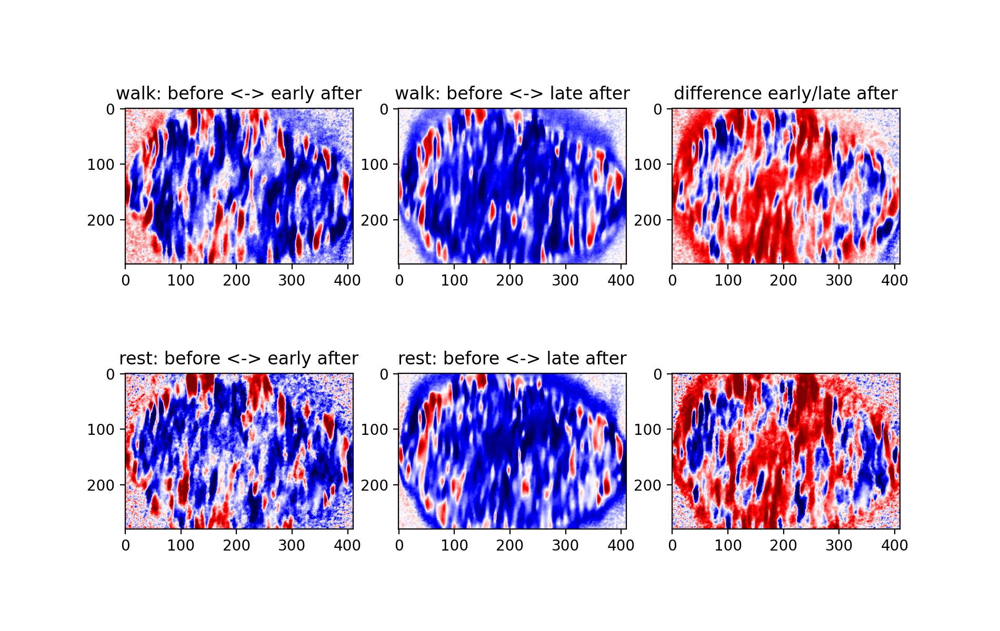

Text(0.5, 1.0, 'difference early/late after')

In [105]:
%matplotlib notebook
fig, axs = plt.subplots(2,3, figsize=(9.5, 6))
clim = np.quantile(w_inter_pca_walk_1, 0.99)
axs[0,0].imshow(w_inter_pca_walk_1.reshape(280,-1), clim=[-clim, clim], cmap=plt.cm.get_cmap("seismic"))
axs[0,0].set_title("walk: before <-> early after")
axs[0,1].imshow(w_inter_pca_walk_2.reshape(280,-1), clim=[-clim, clim], cmap=plt.cm.get_cmap("seismic"))
axs[0,1].set_title("walk: before <-> late after")
axs[0,2].imshow(w_inter_pca_walk_1.reshape(280,-1)-w_inter_pca_walk_2.reshape(280,-1), clim=[-clim, clim], cmap=plt.cm.get_cmap("seismic"))
axs[0,2].set_title("difference early/late after")
axs[1,0].imshow(w_inter_pca_rest_1.reshape(280,-1), clim=[-clim, clim], cmap=plt.cm.get_cmap("seismic"))
axs[1,0].set_title("rest: before <-> early after")
axs[1,1].imshow(w_inter_pca_rest_2.reshape(280,-1), clim=[-clim, clim], cmap=plt.cm.get_cmap("seismic"))
axs[1,1].set_title("rest: before <-> late after")
axs[1,2].imshow(w_inter_pca_rest_1.reshape(280,-1)-w_inter_pca_rest_2.reshape(280,-1), clim=[-clim, clim], cmap=plt.cm.get_cmap("seismic"))
axs[0,2].set_title("difference early/late after")